In [37]:
import json
import re
import os

import base64
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

In [38]:

def parse_polygon_string(polygon_str):
    pattern = r'<(\d+)><(\d+)>'
    matches = re.findall(pattern, polygon_str)
    
    coordinates = [(int(x), int(y)) for x, y in matches]
    
    return coordinates


def get_bounding_box(coordinates):
    x_coords = [x for x, y in coordinates]
    y_coords = [y for x, y in coordinates]
    
    min_x = min(x_coords)
    max_x = max(x_coords)
    min_y = min(y_coords)
    max_y = max(y_coords)
    
    return (min_x, min_y, max_x, max_y)


def read_json_result(file_name):
    
    file_json = open(file_name)
    json_array =  json.load(file_json)
    
    image_id_list = []
    image_path_list = []
    modality_list = []
    crop_list = []
    segmentation_poly_list = []
    
    for json_obj in json_array:
        image_id = json_obj['id']
        image_path = json_obj['images']
        modality = json_obj['modality']
        crop = json_obj['crop']
        
        polygon_list = json_obj['conversations'][1]['content'].split('</poly>')[:-1]
        
        segmentation_poly = []
        for i, poly in enumerate(polygon_list):
            coordinates = parse_polygon_string(poly)

            bounding_box = get_bounding_box(coordinates)
            segmentation_poly.append(bounding_box)
        
        
        image_id_list.append(image_id)
        image_path_list.append(image_path)
        modality_list.append(modality)
        crop_list.append(crop)
        segmentation_poly_list.append(segmentation_poly)

#     try:
#         info_json = json_obj['info']
#         result_task = info_json['task']
#     except:
#         result_task = json_obj['task']
#     data_json = json_obj['data']
#     y_true = []
#     y_pred = []
#     class_names = []
#     for data_i in data_json:
#         y_true.append(data_i['gt'].replace(".",""))
#         try:
#             y_pred.append(data_i['answer'].replace(".",""))
#         except:
#             y_pred.append(str(data_i['answer']))
#         if data_i['gt'].replace(".","") not in class_names:
#             class_names.append(data_i['gt'].replace(".",""))
            
    return image_id_list, image_path_list, modality_list, crop_list, segmentation_poly_list



In [39]:
json_file = "[PIX_SEG]BH-Pools_Watertanks_Datasets_Annotations_test.json"
json_dir = "/datadisk3/evaluation/json_data/20241025/Experiments/Test-split/"
image_id_list, image_path_list, modality_list, crop_list, bbox_list = read_json_result(json_dir+json_file)

In [40]:
data_list = list(zip(image_id_list, image_path_list, modality_list, crop_list, bbox_list))[0:10]

In [41]:
data_list

[('000001694161',
  ['BH-Pools_Watertanks_Datasets/BH-WATERTANKS/REGION_2/IMAGES/18.jpg'],
  'RGB-Satellite',
  [0, 0, 448, 448],
  [(621, 895, 665, 938), (973, 27, 1000, 67)]),
 ('000001694163',
  ['BH-Pools_Watertanks_Datasets/BH-WATERTANKS/REGION_2/IMAGES/18.jpg'],
  'RGB-Satellite',
  [0, 0, 448, 448],
  []),
 ('000001694167',
  ['BH-Pools_Watertanks_Datasets/BH-WATERTANKS/REGION_2/IMAGES/18.jpg'],
  'RGB-Satellite',
  [0, 403, 448, 851],
  [(346, 690, 391, 732),
   (725, 319, 770, 362),
   (92, 304, 136, 346),
   (761, 210, 806, 252),
   (625, 0, 661, 33)]),
 ('000001694180',
  ['BH-Pools_Watertanks_Datasets/BH-WATERTANKS/REGION_2/IMAGES/18.jpg'],
  'RGB-Satellite',
  [0, 806, 448, 1254],
  [(404, 982, 444, 1000), (317, 688, 362, 730), (167, 230, 212, 272)]),
 ('000001694190',
  ['BH-Pools_Watertanks_Datasets/BH-WATERTANKS/REGION_2/IMAGES/18.jpg'],
  'RGB-Satellite',
  [0, 1209, 448, 1657],
  [(951, 792, 996, 835),
   (0, 460, 47, 538),
   (292, 310, 337, 353),
   (402, 85, 446, 1

In [15]:
def seg_to_det_json(data_list):
    info_dic ={"dataset":"Pipe",
              "modality":data_list[0][2],
              "task":"null",
              "categories":[]}
    data_json = []
    for data_obj in data_list:
        obj_anno = []
        for box in data_obj[4]:
            obj_box = {
                        "bbox":[box[0],box[1],box[2],box[3]],
                        "bbox_type":"hbb",
                        "label":"",
                        "description":"",
                        "segmentation":[],
                        "segmentation_mask":""
                      }
            obj_anno.append(obj_box)
                      
                      
                      
                      
        data_dic = { "image":data_obj[1],
                     "size":[],
                     "object_annotations":obj_anno,
                     "crop":data_obj[3]
                   }
        data_json.append([data_dic])
        
    final_json = {"info":info_dic,
                  "data":data_json
                 
                 }
    
    return final_json
                    

In [16]:
final_json = seg_to_det_json(data_list)

In [17]:
with open(json_file, "w") as file:
    json.dump(final_json, file, indent=4)

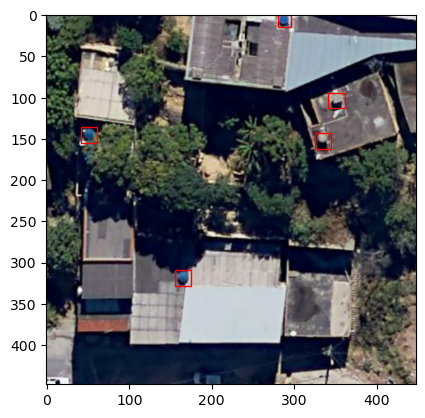

In [22]:
image_index = 2
image_file = data_list[image_index][1]

image_path = (os.path.join("/goss/Datasets/", image_file[0]))
image_full = Image.open(image_path).convert('RGB')
image_crop = image_full.crop(data_list[image_index][3])

for x1,y1,x2,y2 in data_list[image_index][4]:
    x1,y1,x2,y2 = x1*image_crop.size[0]/1000, y1*image_crop.size[1]/1000, x2*image_crop.size[0]/1000, y2*image_crop.size[1]/1000

    plt.imshow(image_crop)
    ax = plt.gca()
    rectangle = Rectangle((x1, y1), x2-x1, y2-y1, linewidth=1, edgecolor='r', facecolor='none')
    ax.add_patch(rectangle)
plt.show()

In [30]:
import cv2
image = cv2.imread(image_path)



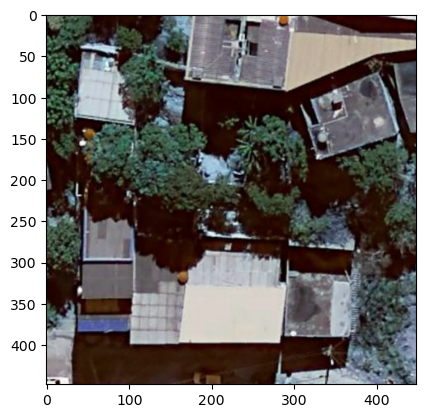

In [31]:
plt.imshow(cropped_gt)

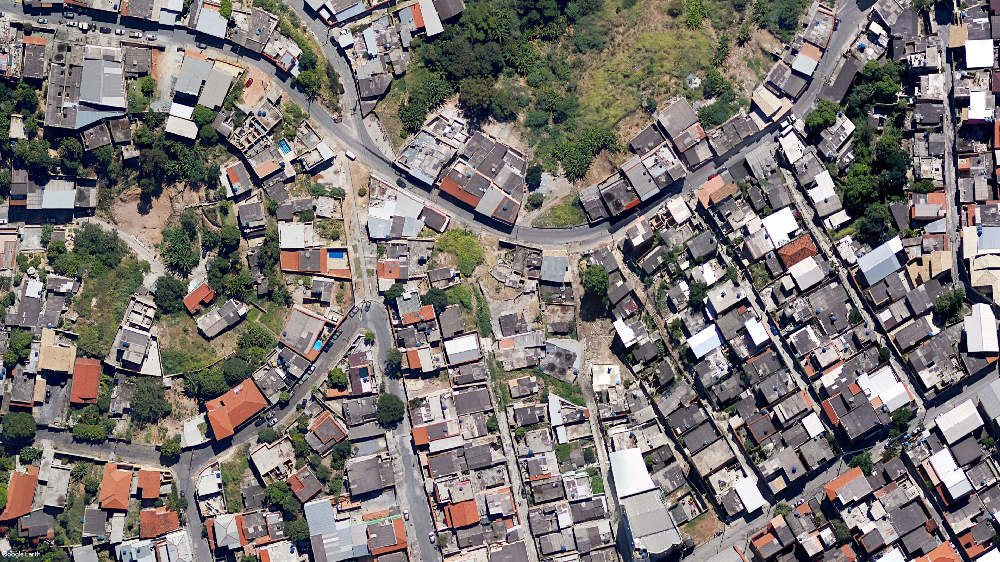

(278.208, 400.96, 297.92, 420.224)

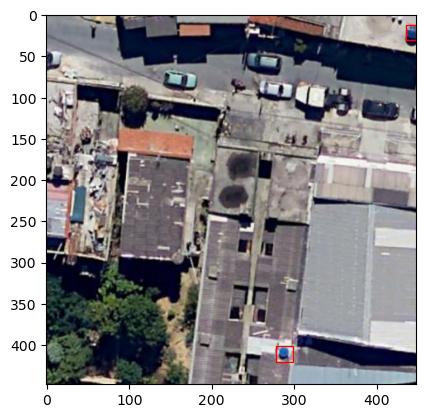